# Objective

Bring in Scope 3 dataset along with Scope 1 and 2 data.  Set datatypes with dictionary.  Examine dataframe.

In [1]:
import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import squarify
pd.set_option('display.max_columns', None)

In [2]:
path_Scope_3_df = r"C:\Users\cliff\Downloads\Scope_3_df.csv"

dtype_dict = {
    "Year of Data": str,
    "Primary activity": str,
    "Primary sector": str,
    "Primary industry": str,
    "Account Numbers": str,
    "Countries": str,
    "Company Name": str,
    "Primary Stock Ticker": str,
    "Row_num": str,
    "Scope 3 Sources": str,
    "Evaluation Status": str,
    "Calculation Methodology": str,
    "Explanation": str,
    "Scope 3 Amount": float,
    "Perc emissions calculated w primary data": float,
    "Scope 1 2 total emission": float,
    "Scope 1 2 max": float,
    "Scope 1 2 Normalized": float,
    "Scope 3 max": float,
    "Scope 3 estimate": float,
    "Scope 3 Amount or Estimate": float
}


Scope_3_df = pd.read_csv(path_Scope_3_df, dtype=dtype_dict)

C:\Users\cliff\AppData\Local\Temp\ipykernel_31264\1016020662.py:28: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  Scope_3_df = pd.read_csv(path_Scope_3_df, dtype=dtype_dict)


In [3]:
Scope_3_df.head(20)

,Year of Data,Primary activity,Primary sector,Primary industry,Account Numbers,Countries,Company Name,Primary Stock Ticker,Row_num,Scope 3 Sources,Evaluation Status,Scope 3 Amount,Calculation Methodology,Perc emissions calculated w primary data,Explanation,Scope 1 2 total emission,Scope 1 2 max,Scope 1 2 Normalized,Scope 3 max,Scope 3 estimate,Scope 3 Amount or Estimate
0,2013,Asset managers,Financial services,Services,44,United Kingdom,3i Group,III LN,1,Purchased goods and services,Not evaluated,NaN,NaN,NaN,We do not have access to this data at this poi...,406.35,28946108.88,0.000014,NaN,0.000000,0.00
1,2013,Asset managers,Financial services,Services,44,United Kingdom,3i Group,III LN,2,Capital goods,Not evaluated,NaN,NaN,NaN,We do not have access to this data at this poi...,406.35,28946108.88,0.000014,NaN,0.000000,0.00
2,2013,Asset managers,Financial services,Services,44,United Kingdom,3i Group,III LN,3,Fuel-and-energy-related activities (not includ...,"Not relevant, explanation provided",0.00,NaN,NaN,We do not have any fuel or energy related acti...,406.35,28946108.88,0.000014,1.766200e+05,2.479419,0.00
3,2013,Asset managers,Financial services,Services,44,United Kingdom,3i Group,III LN,4,Upstream transportation and distribution,"Not relevant, explanation provided",0.00,NaN,NaN,NaN,406.35,28946108.88,0.000014,1.361260e+06,19.109581,0.00
4,2013,Asset managers,Financial services,Services,44,United Kingdom,3i Group,III LN,5,Waste generated in operations,"Relevant, calculated",12.34,Defra 2012,NaN,NaN,406.35,28946108.88,0.000014,1.739253e+05,2.441590,12.34
5,2013,Asset managers,Financial services,Services,44,United Kingdom,3i Group,III LN,6,Business travel,"Relevant, calculated",56.78,Defra 2012,NaN,NaN,406.35,28946108.88,0.000014,1.453610e+05,2.040600,56.78
6,2013,Asset managers,Financial services,Services,44,United Kingdom,3i Group,III LN,7,Employee commuting,"Not relevant, explanation provided",0.00,NaN,NaN,Our employees commute into central London usin...,406.35,28946108.88,0.000014,3.508140e+05,4.924782,0.00
7,2013,Asset managers,Financial services,Services,44,United Kingdom,3i Group,III LN,8,Upstream leased assets,Not evaluated,NaN,NaN,NaN,"We have not evaluated up-stream assets, and at...",406.35,28946108.88,0.000014,NaN,0.000000,0.00
8,2013,Asset managers,Financial services,Services,44,United Kingdom,3i Group,III LN,9,Investments,"Not relevant, calculated",NaN,NaN,NaN,We plan to investigate what steps can be taken to,406.35,28946108.88,0.000014,NaN,0.000000,0.00
9,2013,Asset managers,Financial services,Services,44,United Kingdom,3i Group,III LN,10,Downstream transportation and distribution,"Not relevant, explanation provided",0.00,NaN,NaN,We are not involved in transoprt andf distribu...,406.35,28946108.88,0.000014,1.361256e+09,19109.521720,0.00


In [14]:
Scope_3_df['Year of Data'] = Scope_3_df['Year of Data'].astype(str).str.strip()
Scope_3_df['Scope 3 Sources'] = Scope_3_df['Scope 3 Sources'].astype(str).str.strip()

# Filter for 'Year of Data' = '2013' and 'Scope 3 Sources' = 'Use of sold products'
filtered_Scope_3_df = Scope_3_df[
    (Scope_3_df['Year of Data'] == '2013') & 
    (Scope_3_df['Scope 3 Sources'].str.contains('Use of sold products', case=False, na=False))
]



filtered_Scope_3_df.head(10)

,Year of Data,Primary activity,Primary sector,Primary industry,Account Numbers,Countries,Company Name,Primary Stock Ticker,Row_num,Scope 3 Sources,Evaluation Status,Scope 3 Amount,Calculation Methodology,Perc emissions calculated w primary data,Explanation,Scope 1 2 total emission,Scope 1 2 max,Scope 1 2 Normalized,Scope 3 max,Scope 3 estimate,Scope 3 Amount or Estimate
11,2013,Asset managers,Financial services,Services,44,United Kingdom,3i Group,III LN,12,Use of sold products,"Not relevant, explanation provided",0.0,NaN,NaN,We do not produce produce and sell products in...,4.063500e+02,2.894611e+07,0.000014,4.240565e+06,5.952972e+01,0.0
28,2013,Software,IT & software development,Services,45,Brazil,7COMM INFORMATICA LTDA,NaN,12,Use of sold products,NaN,NaN,NaN,NaN,NaN,1.900000e+01,3.622435e+06,0.000005,NaN,0.000000e+00,0.0
45,2013,Infrastructure upkeep & management,Land & property ownership & development,Infrastructure,53,Spain,Abertis Infraestructuras,ABE SM,12,Use of sold products,Not evaluated,NaN,NaN,NaN,NaN,1.435730e+05,1.151117e+06,0.124725,NaN,0.000000e+00,0.0
62,2013,Personal care & household products,Light manufacturing,Manufacturing,55,USA,Amway Corporation,NaN,12,Use of sold products,"Relevant, not yet calculated",NaN,NaN,NaN,NaN,1.681470e+05,1.539222e+09,0.000109,NaN,0.000000e+00,0.0
79,2013,Commercial services,Commercial & consumer services,Services,58,USA,ABM INDUSTRIES INC,ABM US,12,Use of sold products,Not evaluated,NaN,NaN,NaN,NaN,5.818828e+04,3.500000e+07,0.001663,NaN,0.000000e+00,0.0
96,2013,Medical equipment,Medical equipment & supplies,"Biotech, health care & pharma",64,USA,Abbott Laboratories,ABT US,12,Use of sold products,"Not relevant, calculated",31000.0,Sustainability Consortium Open IO Life Cycle t...,0.0,NaN,1.055384e+06,1.881157e+06,0.561029,3.000000e+08,1.683088e+08,31000.0
113,2013,Banks,Financial services,Services,78,United Kingdom,Aberdeen Asset Management,ADN LN,12,Use of sold products,"Not relevant, explanation provided",0.0,NaN,NaN,AAM does not produce products or services that...,3.566200e+03,3.361148e+09,0.000001,8.553264e+06,9.075070e+00,0.0
130,2013,Other professional services,Specialized professional services,Services,79,United Kingdom,A T Kearney Ltd,NaN,12,Use of sold products,NaN,NaN,NaN,NaN,NaN,4.076800e+03,2.596350e+09,0.000002,NaN,0.000000e+00,0.0
147,2013,CCGT generation,Thermal power generation,Power generation,87,Italy,A2A,A2A IM,12,Use of sold products,Not evaluated,NaN,NaN,NaN,NaN,5.226526e+06,3.041624e+08,0.017183,NaN,0.000000e+00,0.0
164,2013,Pulp & paper mills,Wood & paper materials,Materials,119,Canada,Resolute Forest Products Inc.,RFP US,12,Use of sold products,"Not relevant, explanation provided",0.0,NaN,NaN,The use of paper and wood product typically do...,3.967332e+06,1.179875e+07,0.336250,7.572964e+06,2.546411e+06,0.0


# Determine Z scores

Create new columns with corresponding z-scores of all GHG types

In [22]:
import scipy.stats as stats


# filtered_Scope_3_df_2013 = filtered_Scope_3_df.copy()

# Define columns for z-score calculation
columns_to_standardize = [
    'Scope 3 Amount or Estimate', 
    'Scope 1 2 total emission', 
    'Scope 1 2 max', 
    'Scope 3 max'
]

# Compute z-scores safely using .loc
for col in columns_to_standardize:
    if col in filtered_Scope_3_df.columns:
        filtered_Scope_3_df.loc[:, f'{col}_zscore'] = stats.zscore(filtered_Scope_3_df[col], nan_policy='omit')


C:\Users\cliff\AppData\Local\Temp\ipykernel_31156\1666385928.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_Scope_3_df.loc[:, f'{col}_zscore'] = stats.zscore(filtered_Scope_3_df[col], nan_policy='omit')
C:\Users\cliff\AppData\Local\Temp\ipykernel_31156\1666385928.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_Scope_3_df.loc[:, f'{col}_zscore'] = stats.zscore(filtered_Scope_3_df[col], nan_policy='omit')
C:\Users\cliff\AppData\Local\Temp\ipykernel_31156\1666385928.py:17: SettingW

In [178]:
filtered_Scope_3_df.head(10)

,Year of Data,Primary activity,Primary sector,Primary industry,Account Numbers,Countries,Company Name,Primary Stock Ticker,Row_num,Scope 3 Sources,Evaluation Status,Scope 3 Amount,Calculation Methodology,Perc emissions calculated w primary data,Explanation,Scope 1 2 total emission,Scope 1 2 max,Scope 1 2 Normalized,Scope 3 max,Scope 3 estimate,Scope 3 Amount or Estimate,knn_anomaly_score_x,is_outlier_x,knn_anomaly_score_y,is_outlier_y,Scope 3 Amount or Estimate_zscore,Scope 1 2 total emission_zscore,Scope 1 2 max_zscore,Scope 3 max_zscore
11,2013,Asset managers,Financial services,Services,44,United Kingdom,3i Group,III LN,12,Use of sold products,"Not relevant, explanation provided",0.0,NaN,NaN,We do not produce produce and sell products in...,4.063500e+02,2.894611e+07,0.000014,4.240565e+06,5.952972e+01,0.0,0.000000,False,0.000023,False,-0.111091,-0.175644,-0.438825,-0.324685
28,2013,Software,IT & software development,Services,45,Brazil,7COMM INFORMATICA LTDA,NaN,12,Use of sold products,NaN,NaN,NaN,NaN,NaN,1.900000e+01,3.622435e+06,0.000005,NaN,0.000000e+00,0.0,0.000000,False,0.000001,False,-0.111091,-0.175673,-0.459017,NaN
45,2013,Infrastructure upkeep & management,Land & property ownership & development,Infrastructure,53,Spain,Abertis Infraestructuras,ABE SM,12,Use of sold products,Not evaluated,NaN,NaN,NaN,NaN,1.435730e+05,1.151117e+06,0.124725,NaN,0.000000e+00,0.0,0.000000,False,0.000707,False,-0.111091,-0.164948,-0.460988,NaN
62,2013,Personal care & household products,Light manufacturing,Manufacturing,55,USA,Amway Corporation,NaN,12,Use of sold products,"Relevant, not yet calculated",NaN,NaN,NaN,NaN,1.681470e+05,1.539222e+09,0.000109,NaN,0.000000e+00,0.0,0.000000,False,0.007759,False,-0.111091,-0.163112,0.765423,NaN
79,2013,Commercial services,Commercial & consumer services,Services,58,USA,ABM INDUSTRIES INC,ABM US,12,Use of sold products,Not evaluated,NaN,NaN,NaN,NaN,5.818828e+04,3.500000e+07,0.001663,NaN,0.000000e+00,0.0,0.000000,False,0.001668,False,-0.111091,-0.171327,-0.433998,NaN
96,2013,Medical equipment,Medical equipment & supplies,"Biotech, health care & pharma",64,USA,Abbott Laboratories,ABT US,12,Use of sold products,"Not relevant, calculated",31000.0,Sustainability Consortium Open IO Life Cycle t...,0.0,NaN,1.055384e+06,1.881157e+06,0.561029,3.000000e+08,1.683088e+08,31000.0,0.000144,False,0.003402,False,-0.110123,-0.096824,-0.460406,-0.267469
113,2013,Banks,Financial services,Services,78,United Kingdom,Aberdeen Asset Management,ADN LN,12,Use of sold products,"Not relevant, explanation provided",0.0,NaN,NaN,AAM does not produce products or services that...,3.566200e+03,3.361148e+09,0.000001,8.553264e+06,9.075070e+00,0.0,0.000000,False,0.000102,False,-0.111091,-0.175408,2.218172,-0.323851
130,2013,Other professional services,Specialized professional services,Services,79,United Kingdom,A T Kearney Ltd,NaN,12,Use of sold products,NaN,NaN,NaN,NaN,NaN,4.076800e+03,2.596350e+09,0.000002,NaN,0.000000e+00,0.0,0.000000,False,0.000143,False,-0.111091,-0.175370,1.608345,NaN
147,2013,CCGT generation,Thermal power generation,Power generation,87,Italy,A2A,A2A IM,12,Use of sold products,Not evaluated,NaN,NaN,NaN,NaN,5.226526e+06,3.041624e+08,0.017183,NaN,0.000000e+00,0.0,0.000000,False,0.083779,False,-0.111091,0.214814,-0.219376,NaN
164,2013,Pulp & paper mills,Wood & paper materials,Materials,119,Canada,Resolute Forest Products Inc.,RFP US,12,Use of sold products,"Not relevant, explanation provided",0.0,NaN,NaN,The use of paper and wood product typically do...,3.967332e+06,1.179875e+07,0.336250,7.572964e+06,2.546411e+06,0.0,0.000000,False,0.024369,False,-0.111091,0.120736,-0.452498,-0.324040


In [180]:
filtered_zscore_df = filtered_Scope_3_df[['Scope 3 Amount or Estimate_zscore', 'Scope 1 2 total emission_zscore', 'Scope 1 2 max_zscore', 'Account Numbers', 'Countries', 'Company Name']].dropna()

In [182]:
filtered_zscore_df

,Scope 3 Amount or Estimate_zscore,Scope 1 2 total emission_zscore,Scope 1 2 max_zscore,Account Numbers,Countries,Company Name
11,-0.111091,-0.175644,-0.438825,44,United Kingdom,3i Group
28,-0.111091,-0.175673,-0.459017,45,Brazil,7COMM INFORMATICA LTDA
45,-0.111091,-0.164948,-0.460988,53,Spain,Abertis Infraestructuras
62,-0.111091,-0.163112,0.765423,55,USA,Amway Corporation
79,-0.111091,-0.171327,-0.433998,58,USA,ABM INDUSTRIES INC
...,...,...,...,...,...,...
49511,-0.111091,-0.175669,-0.459443,48866,USA,AFS
49528,-0.111091,-0.173901,-0.440131,48895,Poland,Can Pack Glass Making Division
49545,-0.111091,0.318327,-0.452498,49533,Japan,Nippon Paper Industries Co Ltd
49562,0.252360,-0.135708,-0.460154,49607,United Kingdom,CNH Industrial NV


# Visualize Outliers

Here we perform outlier detection using a k-nearest neighbors (KNN) approach on standardized z-score values for Scope 3 emissions (x-axis) and Scope 1 & 2 total emissions (y-axis). After ensuring numerical integrity and removing missing values, it calculates an anomaly score based on the distance to the 5th nearest neighbor, labeling the top 5% as outliers. These results are merged back into the main dataset and visualized using Plotly, with interactivity allowing users to hover over data points to view additional metadata such as account number, country, and company name. This approach enables users to group and explore data by year or other attributes to identify emission reporting anomalies over time and across companies.

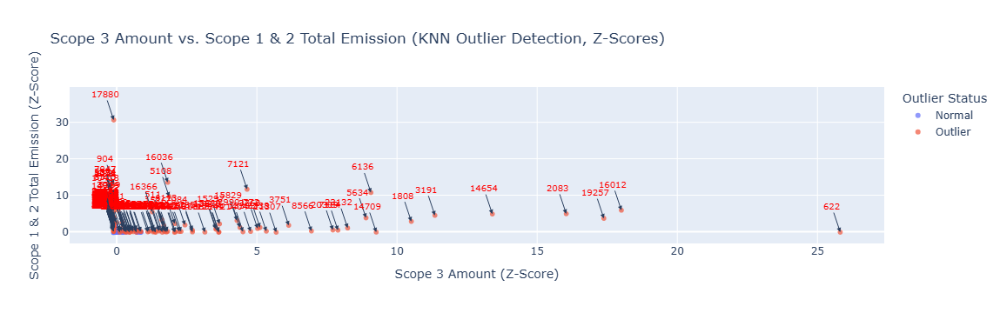

In [184]:
# Re-import necessary libraries since execution state was reset
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.neighbors import NearestNeighbors

# Ensure the z-score data is numeric
features = ['Scope 3 Amount or Estimate_zscore', 'Scope 1 2 total emission_zscore', 'Scope 1 2 max_zscore']
filtered_zscore_df[features] = filtered_zscore_df[features].apply(pd.to_numeric, errors='coerce')

# Drop missing values for KNN processing
knn_data = filtered_zscore_df.dropna(subset=features)

# Fit KNN model using z-score data
k = 5  # Number of neighbors
nbrs = NearestNeighbors(n_neighbors=k, algorithm='auto', metric='euclidean').fit(knn_data[features])

# Compute K-distance (distance to the k-th nearest neighbor)
distances, indices = nbrs.kneighbors(knn_data[features])

# Use the distance to the kth neighbor as an anomaly score
knn_data['knn_anomaly_score'] = distances[:, -1]  # Last column gives k-th neighbor distance

# Define an outlier threshold (e.g., top 5% of highest anomaly scores)
threshold = np.percentile(knn_data['knn_anomaly_score'], 95)
knn_data['is_outlier'] = knn_data['knn_anomaly_score'] > threshold

# Merge anomaly scores back into the main DataFrame
filtered_zscore_df = filtered_zscore_df.merge(knn_data[['knn_anomaly_score', 'is_outlier']], left_index=True, right_index=True, how='left')

# Convert 'is_outlier' to categorical labels
filtered_zscore_df['Outlier Status'] = filtered_zscore_df['is_outlier'].map({True: 'Outlier', False: 'Normal'})

# Create an interactive scatter plot using Plotly with Account Numbers labeled for outliers
fig = px.scatter(
    filtered_zscore_df, 
    x='Scope 3 Amount or Estimate_zscore',  # Now Scope 3 Amount is on x-axis
    y='Scope 1 2 total emission_zscore',    # Scope 1 & 2 Amounts on y-axis
    color='Outlier Status', 
    hover_data=['Account Numbers', 'Countries', 'Company Name'],
    title="Scope 3 Amount vs. Scope 1 & 2 Total Emission (KNN Outlier Detection, Z-Scores)",
    labels={
        "Scope 3 Amount or Estimate_zscore": "Scope 3 Amount (Z-Score)",
        "Scope 1 2 total emission_zscore": "Scope 1 & 2 Total Emission (Z-Score)"
    },
    opacity=0.7
)

# Highlight outliers by labeling their Account Numbers
outliers = filtered_zscore_df[filtered_zscore_df['is_outlier'] == True]
for i, row in outliers.iterrows():
    fig.add_annotation(
        x=row['Scope 3 Amount or Estimate_zscore'], 
        y=row['Scope 1 2 total emission_zscore'], 
        text=str(row['Account Numbers']), 
        showarrow=True,
        arrowhead=2,
        font=dict(size=10, color="red")
    )

# Show the interactive plot
fig.show()


In [9]:
from scipy import stats

# Define columns to standardize
columns_to_standardize = [
    'Scope 3 Amount or Estimate', 
    'Scope 1 2 total emission', 
    'Scope 1 2 max', 
    'Scope 3 max'
]

# Create a dictionary of dataframes filtered for 'Use of sold products' by year from 2013 to 2023
use_of_sold_products_dfs = {}

for year in range(2013, 2024):
    df_filtered = Scope_3_df[
        (Scope_3_df['Year of Data'] == str(year)) & 
        (Scope_3_df['Scope 3 Sources'].str.contains('Use of sold products', case=False, na=False))
    ].copy()  # Create a copy to avoid modifying the original data

    # Standardize numerical columns
    for col in columns_to_standardize:
        if col in df_filtered.columns:
            df_filtered.loc[:, f'{col}_zscore'] = stats.zscore(df_filtered[col], nan_policy='omit')

    # Store the standardized dataframe in the dictionary
    use_of_sold_products_dfs[str(year)] = df_filtered

# Display the updated dictionary of dataframes
#use_of_sold_products_dfs



In [18]:
from sklearn.neighbors import NearestNeighbors
import plotly.express as px

# Iterate through the dictionary of dataframes and apply KNN to each one
knn_plots = {}

for year, df in use_of_sold_products_dfs.items():
    # Ensure the dataframe is not empty
    if df.empty:
        continue

    # Ensure the z-score data is numeric
    features = ['Scope 3 Amount or Estimate_zscore', 'Scope 1 2 total emission_zscore', 'Scope 1 2 max_zscore']
    df[features] = df[features].apply(pd.to_numeric, errors='coerce')

    # Drop missing values for KNN processing
    knn_data = df.dropna(subset=features).copy()  # ✅ Explicitly create a copy

    # Fit KNN model using z-score data
    k = 5  # Number of neighbors
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='auto', metric='euclidean').fit(knn_data[features])

    # Compute K-distance (distance to the k-th nearest neighbor)
    distances, indices = nbrs.kneighbors(knn_data[features])

    # Use the distance to the kth neighbor as an anomaly score
    knn_data.loc[:, 'knn_anomaly_score'] = distances[:, -1]  # ✅ Use .loc[] to avoid SettingWithCopyWarning

    # Define an outlier threshold (e.g., top 5% of highest anomaly scores)
    threshold = np.percentile(knn_data['knn_anomaly_score'], 95)
    knn_data.loc[:, 'is_outlier'] = knn_data['knn_anomaly_score'] > threshold  # ✅ Use .loc[]

    # Merge anomaly scores back into the main DataFrame
    df = df.merge(knn_data[['knn_anomaly_score', 'is_outlier']], left_index=True, right_index=True, how='left')

    # Convert 'is_outlier' to categorical labels
    df['Outlier Status'] = df['is_outlier'].map({True: 'Outlier', False: 'Normal'})

    # Create an interactive scatter plot using Plotly with Account Numbers labeled for outliers
    fig = px.scatter(
        df, 
        x='Scope 3 Amount or Estimate_zscore',  # X-axis: Scope 3 Amount
        y='Scope 1 2 total emission_zscore',    # Y-axis: Scope 1 & 2 Total Emission
        color='Outlier Status', 
        hover_data=['Account Numbers', 'Countries', 'Company Name'],
        title=f"Scope 3 Amount vs. Scope 1 & 2 Total Emission (KNN Outlier Detection, {year})",
        labels={
            "Scope 3 Amount or Estimate_zscore": "Scope 3 Amount (Z-Score)",
            "Scope 1 2 total emission_zscore": "Scope 1 & 2 Total Emission (Z-Score)"
        },
        opacity=0.7
    )

    # Highlight outliers by labeling their Account Numbers
    outliers = df[df['is_outlier'] == True]
    for i, row in outliers.iterrows():
        fig.add_annotation(
            x=row['Scope 3 Amount or Estimate_zscore'], 
            y=row['Scope 1 2 total emission_zscore'], 
            text=str(row['Account Numbers']), 
            showarrow=True,
            arrowhead=2,
            font=dict(size=10, color="red")
        )

    # Store the plot in the dictionary
    knn_plots[year] = fig




Displaying plot for year: 2013


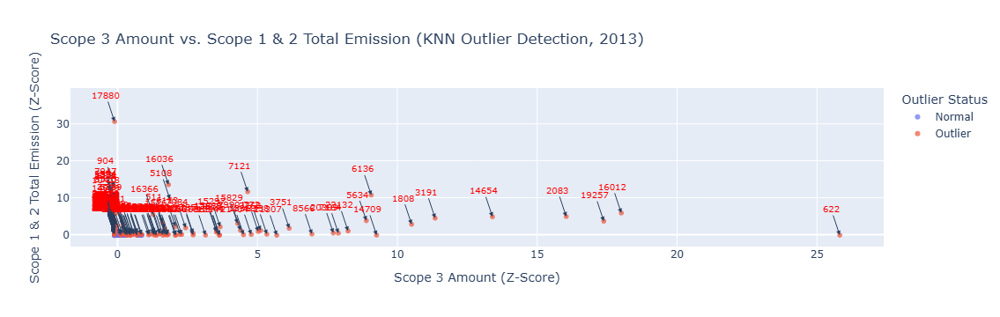

Displaying plot for year: 2014


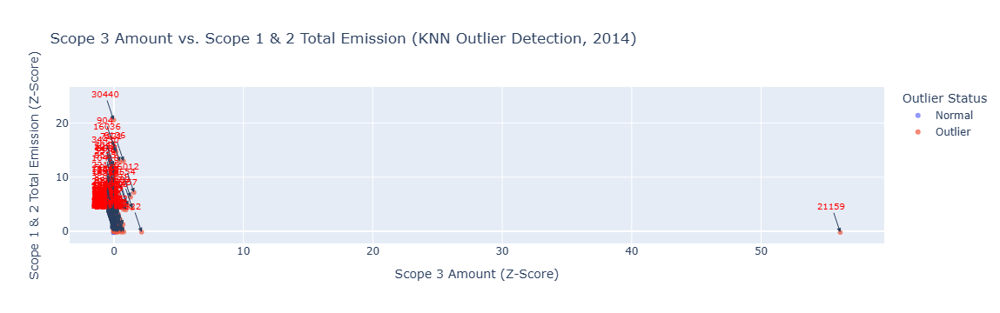

Displaying plot for year: 2015


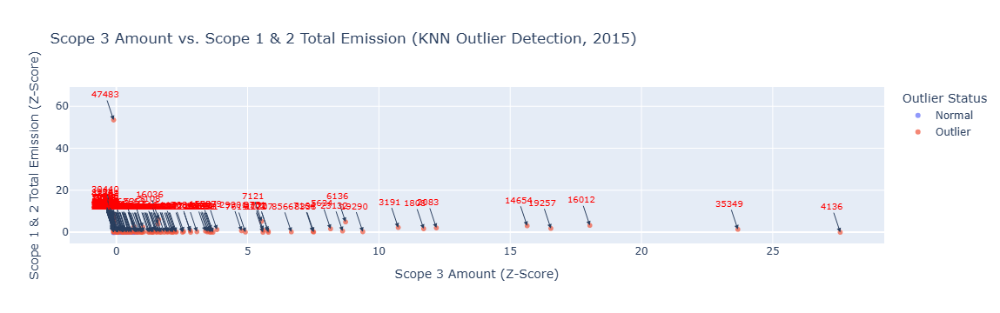

Displaying plot for year: 2016


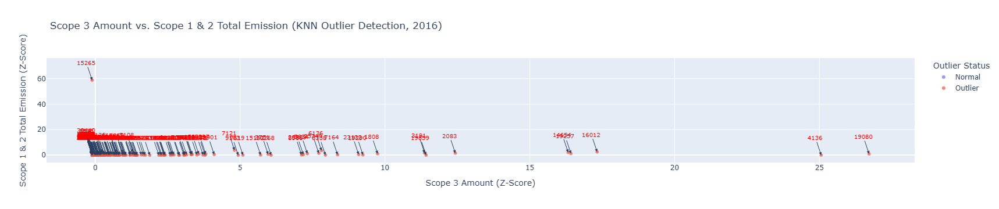

Displaying plot for year: 2017


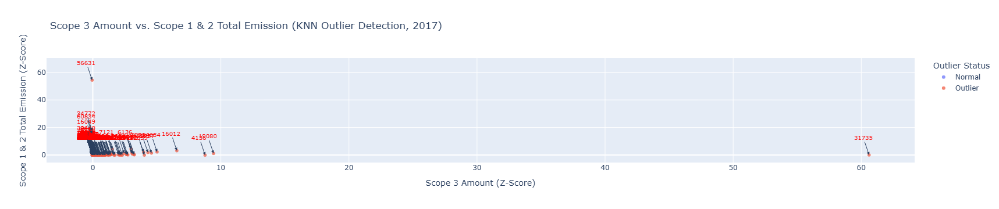

Displaying plot for year: 2018


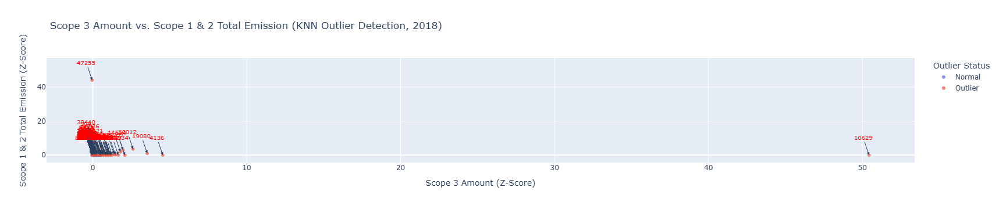

Displaying plot for year: 2019


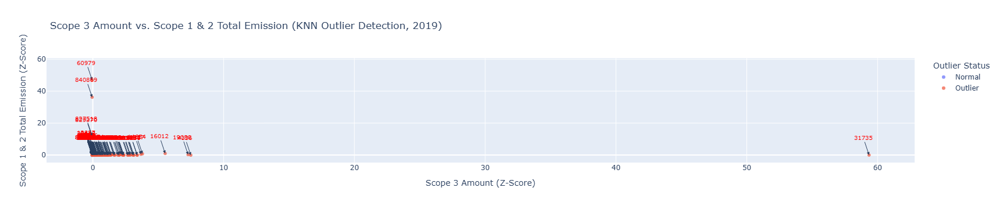

Displaying plot for year: 2020


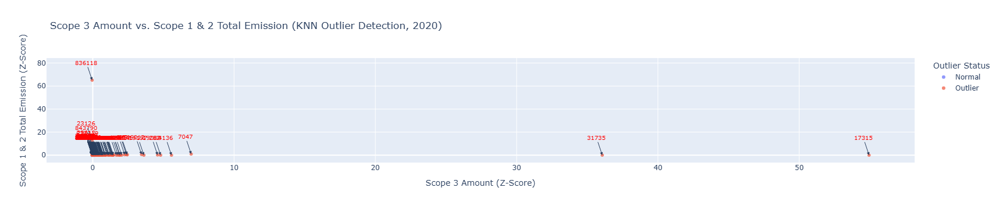

Displaying plot for year: 2021


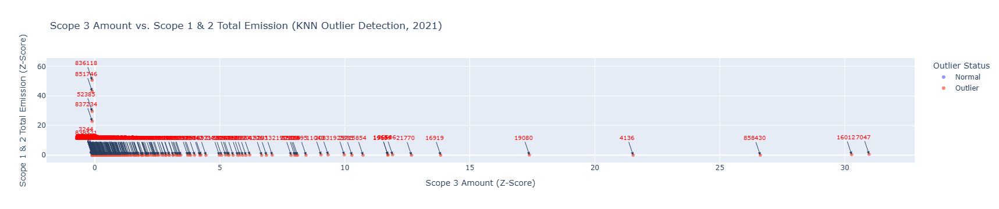

Displaying plot for year: 2022


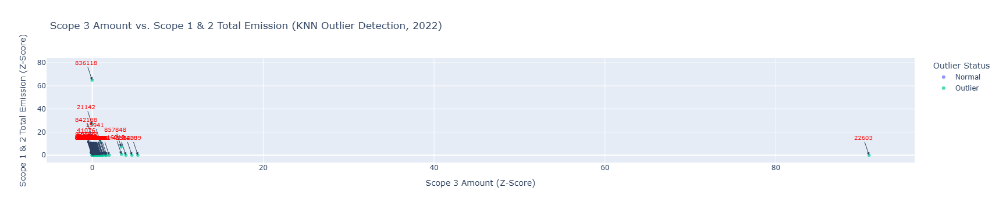

Displaying plot for year: 2023


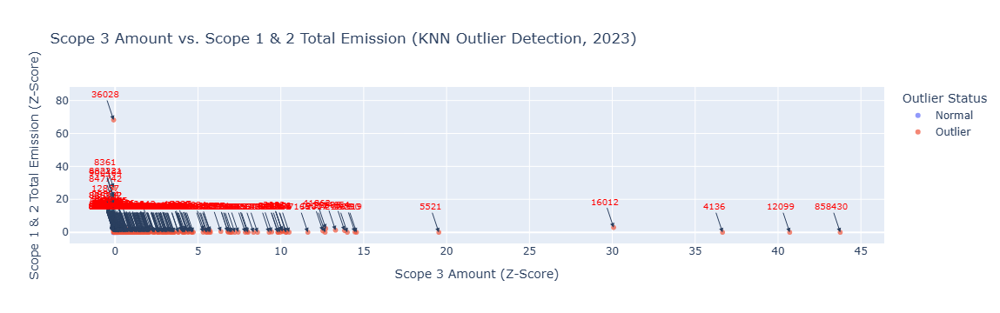

In [19]:
# Loop through the dictionary and display each plot
for year, fig in knn_plots.items():
    print(f"Displaying plot for year: {year}")
    fig.show()


# Results

The plots are interesting in that they highlight outliers across all emission types; however, the original intent was to cluster the data by industry or other classifications to better understand potential underlying causes. Unfortunately, that approach did not yield meaningful groupings, so this particular dataset was not further utilized in the final analysis.
